In [31]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim

data = pd.read_csv('../data/data_3_2.csv').to_numpy()

x = data[:, :-1]
y = data[:, -1]  # Labels (class 0, 1, 2, or 3)

print('x', x.shape)
print('y', y.shape)

x (300, 2)
y (300,)


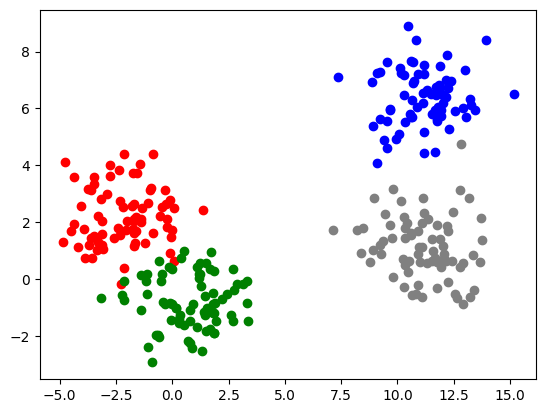

In [25]:
import matplotlib.pyplot as plt

# x1 = x[:, 0]
# x2 = x[:, 1]

plt.scatter(x[y == 0][:, 0], x[y == 0][:, 1], color='red')
plt.scatter(x[y == 1][:, 0], x[y == 1][:, 1], color='blue')
plt.scatter(x[y == 2][:, 0], x[y == 2][:, 1], color='green')
plt.scatter(x[y == 3][:, 0], x[y == 3][:, 1], color='grey')

In [30]:
# class
y0= np.where(y == 0, 1, 0)
y1 = np.where(y == 1, 1, 0)
y2 = np.where(y == 2, 1, 0)
y3 = np.where(y == 3, 1, 0)
print("yO", y0)

yO [0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 1 1 0 1 0 1 0 0 1 0 0 1 0 1 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 1 0 0 0 1 0 0 1 0 0 1 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 1
 1 0 0 0 1 0 0 0 0 0 0 1 1 1 1 0 1 0 0 0 0 1 0 0 1 1 0 1 0 0 0 0 1 1 0 0 1
 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 0
 0 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0
 1 1 0 0 0 0 1 0 1 0 1 1 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0
 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 1 0 1 0 0 0 0 0 0 1 1 0
 0 0 1 0]


In [29]:
# Feature scaling
def feature_scaling(x):
    mu = np.mean(x, axis=0)
    return (x - mu) / (np.max(x, axis=0) - np.min(x, axis=0))

x_scaled = feature_scaling(x)



In [34]:
# Convert data to tensors
tx = torch.tensor(x_scaled, dtype=torch.float32)

# Define a binary classification model
class BinaryModel(nn.Module):
    def __init__(self, num_input):
        super().__init__()
        self.linear1 = nn.Linear(num_input, 16)
        self.linear2 = nn.Linear(16, 1)

    def forward(self, x):
        x = torch.relu(self.linear1(x))
        x = torch.sigmoid(self.linear2(x))  # Sigmoid for binary classification
        return x

    def train(self, x, y, num_iter=500, lr=0.1):
        opt = optim.SGD(self.parameters(), lr=lr)
        criterion = nn.BCELoss()
        for i in range(num_iter):
            z = self(x).flatten()
            loss = criterion(z, y)
            if i % 100 == 0:
                print(f'iter: {i}, loss: {loss.item()}')
            loss.backward()
            opt.step()
            opt.zero_grad()

    def evaluate(self, x, y):
        z = self(x).flatten()
        predictions = (z > 0.5).float()
        accuracy = (predictions == y).float().mean()
        return accuracy


In [35]:
import torch
import torch.nn as nn
import torch.optim as optim

class MyModel(nn.Module):
  def __init__(self, num_input):
    super().__init__()
    self.linear = nn.Linear(num_input, 1)

  def forward(self, x):
    output = self.linear(x)
    # print("Linear: ", x)
    output = torch.sigmoid(output)
   
    return output.flatten()

  def train(self, x, y, num_iter=500, lr=0.1):
    opt = optim.SGD(self.parameters(), lr=lr)
    for i in range(num_iter):
      z = self(x)
      J = -y*torch.log(z) - (1-y)*torch.log(1-z)
      J = J.mean()
      # print("J: ", J.mean())
      if i % 20 == 0:
        print('iter: %d, J: %f' % (i, J.item()))
      J.backward()
      opt.step()
      opt.zero_grad()

  def evaluate(self, x, y):
    z = self(x)
    z = (z > 0.5).float()
    return (z == y).float().mean()

tmp = torch.rand(100, 4)
model = MyModel(4)
output = model(tmp)
print('output', output.shape)

output torch.Size([100])


In [23]:
tx = torch.tensor(x, dtype=torch.float32)
ty = torch.tensor(y, dtype=torch.float32)

model1 = MyModel(2)
model1.train(tx, ty, num_iter=1000)

accurary = model1.evaluate(tx, ty)
print('accurary', accurary.item())

Linear:  tensor([[ 1.0520e+01,  6.5000e-01],
        [ 1.4600e+00, -1.2500e+00],
        [ 1.5000e+00,  5.6000e-01],
        [-1.3600e+00,  2.5000e+00],
        [ 1.1160e+01,  5.1900e+00],
        [ 1.1880e+01,  7.4900e+00],
        [ 1.4500e+00, -5.9000e-01],
        [ 1.8000e-01, -9.9000e-01],
        [ 1.3770e+01,  1.3800e+00],
        [ 7.8000e-01, -1.0600e+00],
        [ 1.6700e+00, -1.7400e+00],
        [ 1.1800e+01,  6.0500e+00],
        [ 1.2500e+00,  5.9000e-01],
        [ 1.1910e+01,  6.4000e-01],
        [-4.7000e-01,  2.5400e+00],
        [ 1.1890e+01,  6.7600e+00],
        [ 1.2180e+01,  6.4100e+00],
        [ 9.9600e+00,  4.9400e+00],
        [ 1.0690e+01,  7.6200e+00],
        [-1.3000e-01,  4.2000e-01],
        [-3.4900e+00,  1.5100e+00],
        [ 1.0920e+01,  7.2200e+00],
        [ 1.7900e+00, -4.8000e-01],
        [ 1.1670e+01,  4.4700e+00],
        [-1.7600e+00,  3.7200e+00],
        [ 1.2190e+01,  7.8900e+00],
        [-4.3700e+00,  1.9600e+00],
        [ 1.1090e+0